# **Yolov8 Model**

## **Libraries**

In [1]:
import os
import cv2
import numpy as np
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
from collections import Counter, defaultdict
from ultralytics import YOLO
import shutil
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_auc_score
import pandas as pd
import squarify

In [33]:
import torch, detectron2
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

torch:  2.4 ; cuda:  cu121
detectron2: 0.6


## **Data Preparation**

In [2]:
# Path to your dataset
image_dir = 'Train Images'
annotation_dir = 'Train Images'
output_annotation_dir = 'Train Images'  # Path to save YOLO txt annotations

In [3]:
# Define the classes
classes = [
    "bicycle", "bus", "car", "cng", "easybike", "leguna", "bike", "rickshaw", "van", "truck","wheelbarrow"
]

### Annotation

In [4]:
# Function to parse XML annotation
def parse_annotation(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    boxes = []
    for obj in root.iter('object'):
        label = obj.find('name').text
        xmlbox = obj.find('bndbox')
        b = (int(xmlbox.find('xmin').text), int(xmlbox.find('ymin').text), 
             int(xmlbox.find('xmax').text), int(xmlbox.find('ymax').text))
        boxes.append((label, b))
    return boxes

# Function to load image and annotation
def load_image_and_annotation(image_path, annotation_path):
    image = cv2.imread(image_path)
    boxes = parse_annotation(annotation_path)
    return image, boxes

In [37]:
# Visualize image with bounding boxes
def visualize_image(image, boxes):
    for label, (xmin, ymin, xmax, ymax) in boxes:
        cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
        cv2.putText(image, label, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.show()

### Visualization

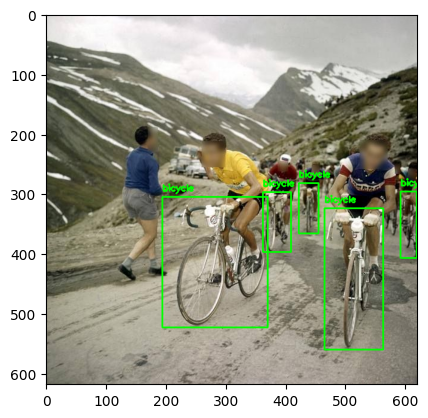

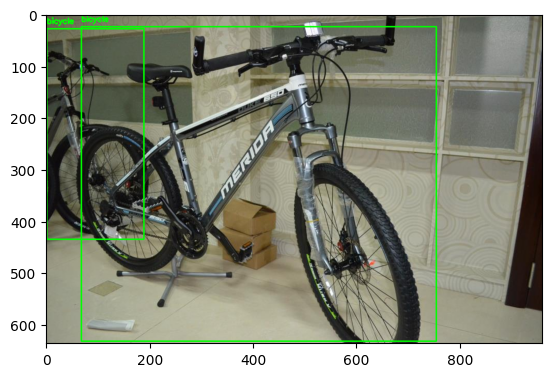

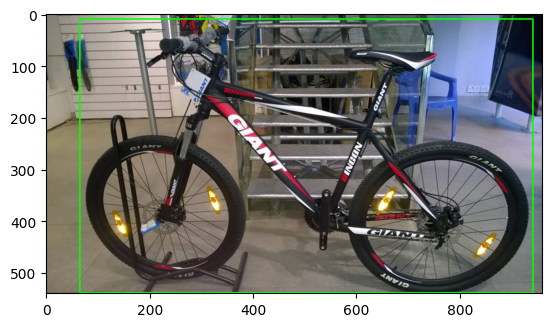

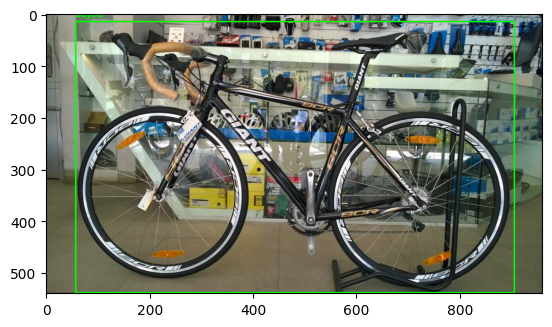

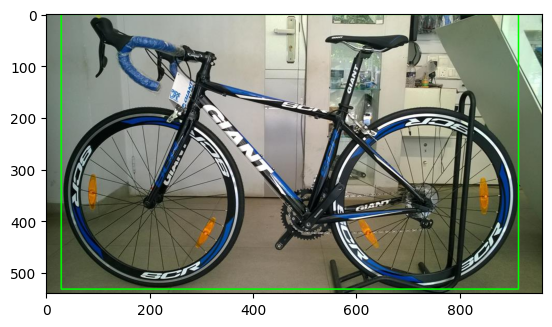

...

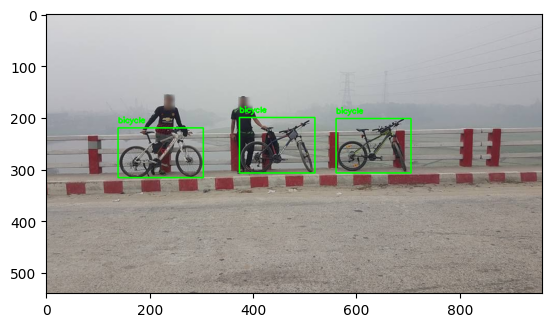

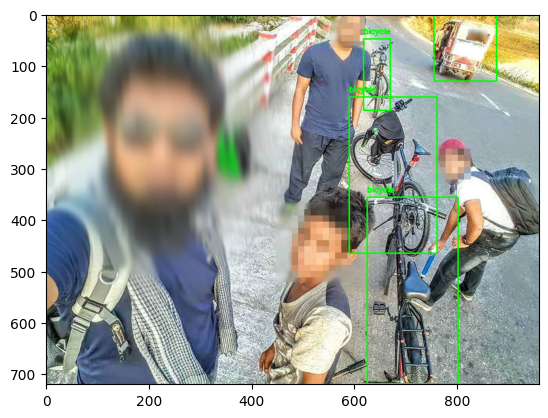

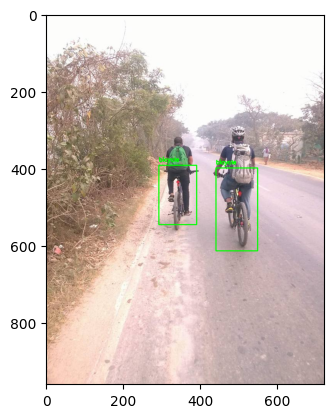

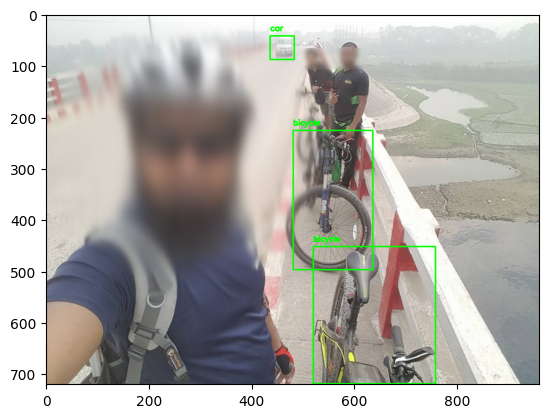

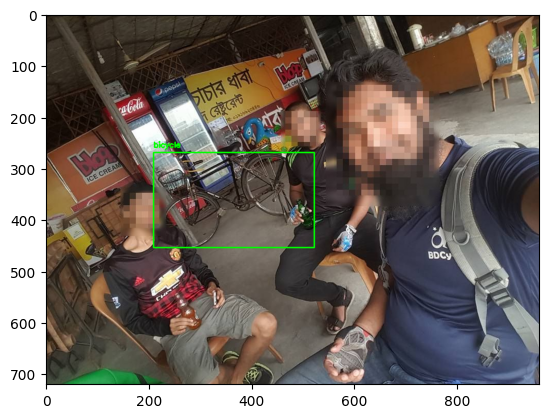

KeyboardInterrupt: 

In [38]:
# Example usage
image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]
for image_file in image_files:
    image_path = os.path.join(image_dir, image_file)
    annotation_path = os.path.join(annotation_dir, image_file.replace('.jpg', '.xml'))
    image, boxes = load_image_and_annotation(image_path, annotation_path)
    visualize_image(image, boxes)

In [5]:
# Function to parse XML annotation
def parse_annotation(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    labels = []
    for obj in root.iter('object'):
        label = obj.find('name').text
        labels.append(label)
    return labels

# Count class occurrences
def count_classes(annotation_dir):
    class_counts = Counter()
    total_objects = 0
    for file in os.listdir(annotation_dir):
        if file.endswith('.xml'):
            labels = parse_annotation(os.path.join(annotation_dir, file))
            class_counts.update(labels)
            total_objects += len(labels)
    return class_counts, total_objects

# Count classes in the annotations directory
class_counts, total_objects = count_classes(annotation_dir)

In [7]:
# Create a list to store the statistics
class_stats = []

for class_name in classes:
    count = class_counts[class_name]
    percentage = (count / total_objects) * 100
    class_stats.append({
        'Class': class_name,
        'Count': count,
        'Percentage': f'{percentage:.2f}%'
    })

# Create a DataFrame to display the table
df = pd.DataFrame(class_stats)

# Print the table
print(df)

# Optionally, save the table to a CSV file
df.to_csv('class_statistics.csv', index=False)

          Class  Count Percentage
0       bicycle   1606      7.40%
1           bus   1652      7.61%
2           car   3203     14.76%
3           cng   2036      9.38%
4      easybike   1577      7.27%
5        leguna    736      3.39%
6          bike   2001      9.22%
7      rickshaw   3245     14.96%
8           van   2019      9.31%
9         truck   1656      7.63%
10  wheelbarrow    602      2.77%


PermissionError: [Errno 13] Permission denied: 'class_statistics.csv'

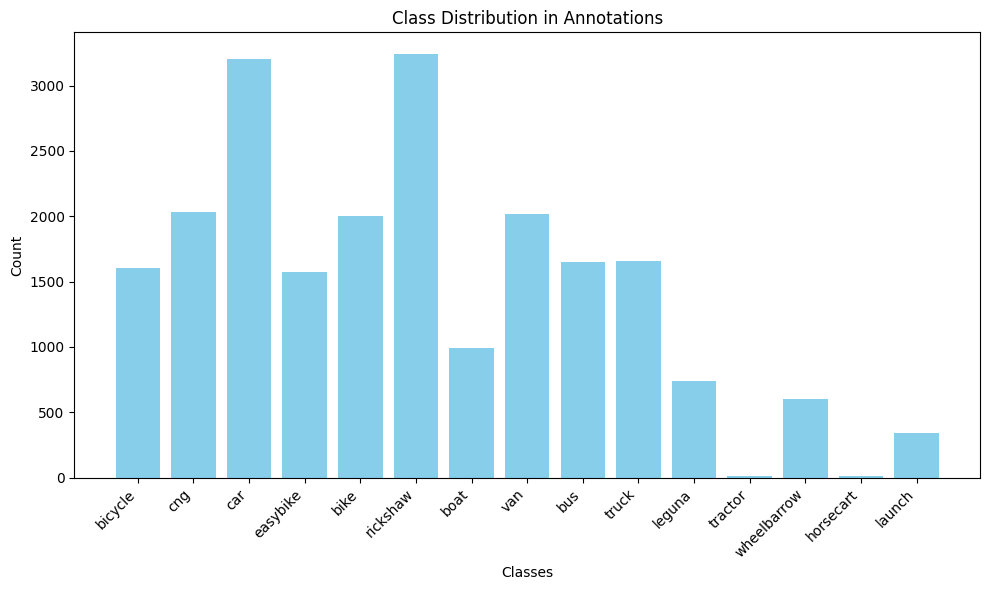

In [10]:
# Plot class distribution
def plot_class_distribution(class_counts):
    classes = list(class_counts.keys())
    counts = list(class_counts.values())

    plt.figure(figsize=(10, 6))
    plt.bar(classes, counts, color='skyblue')
    plt.xlabel('Classes')
    plt.ylabel('Count')
    plt.title('Class Distribution in Annotations')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

plot_class_distribution(class_counts)

In [11]:
# Function to parse XML annotation and return bounding box dimensions
def parse_annotation_for_size(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    objects = []
    
    for obj in root.iter('object'):
        label = obj.find('name').text
        xmlbox = obj.find('bndbox')
        xmin = int(xmlbox.find('xmin').text)
        ymin = int(xmlbox.find('ymin').text)
        xmax = int(xmlbox.find('xmax').text)
        ymax = int(xmlbox.find('ymax').text)

        width = xmax - xmin
        height = ymax - ymin
        area = width * height

        objects.append((label, width, height, area))
    
    return objects

In [12]:
# Function to get size properties for all annotations
def calculate_size_statistics(annotation_dir):
    size_stats = {cls: {'widths': [], 'heights': [], 'areas': []} for cls in classes}
    
    for xml_file in os.listdir(annotation_dir):
        if not xml_file.endswith('.xml'):
            continue
        annotation_path = os.path.join(annotation_dir, xml_file)
        objects = parse_annotation_for_size(annotation_path)
        
        for label, width, height, area in objects:
            if label in size_stats:
                size_stats[label]['widths'].append(width)
                size_stats[label]['heights'].append(height)
                size_stats[label]['areas'].append(area)
    
    return size_stats

# Calculate average size properties
def aggregate_size_statistics(size_stats):
    aggregated_data = []

    for label in classes:
        widths = size_stats[label]['widths']
        heights = size_stats[label]['heights']
        areas = size_stats[label]['areas']

        avg_width = sum(widths) / len(widths) if widths else 0
        avg_height = sum(heights) / len(heights) if heights else 0
        avg_area = sum(areas) / len(areas) if areas else 0

        aggregated_data.append({
            'Class': label,
            'Avg Width': avg_width,
            'Avg Height': avg_height,
            'Avg Area': avg_area
        })

    return pd.DataFrame(aggregated_data)

In [13]:
# Calculate size statistics
size_stats = calculate_size_statistics(annotation_dir)

# Aggregate statistics into a table
size_table = aggregate_size_statistics(size_stats)

# Display the table
print(size_table)

# Optionally, save the table to a CSV file
size_table.to_csv('object_size_statistics.csv', index=False)

         Class    Avg Width   Avg Height      Avg Area
0      bicycle   306.341220   281.632005  1.443207e+05
1          bus   608.242131   505.922518  6.221552e+05
2          car   381.724009   288.800812  2.287432e+05
3     easybike   977.294864  1087.238427  1.769136e+06
4       leguna   909.682065   812.032609  1.104510e+06
5         bike   460.850575   439.606697  3.042169e+05
6     rickshaw   478.133436   665.302619  6.290905e+05
7          van  1102.526003   732.939079  1.166935e+06
8        truck   880.451087   688.286836  1.079870e+06
9  wheelbarrow  1344.141196   905.308970  1.584663e+06


In [21]:
# Function to parse XML annotation and return bounding boxes
def parse_annotation(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    boxes = []
    for obj in root.iter('object'):
        xmlbox = obj.find('bndbox')
        xmin = int(xmlbox.find('xmin').text)
        ymin = int(xmlbox.find('ymin').text)
        xmax = int(xmlbox.find('xmax').text)
        ymax = int(xmlbox.find('ymax').text)
        
        # Ensure exactly 4 values are returned
        boxes.append((xmin, ymin, xmax, ymax))
    
    # Print boxes to check their structure if necessary
    print(f"Parsed boxes: {boxes}")
    return boxes

In [22]:
# Example usage in the heatmap generation function
def create_heatmaps(annotation_dir, img_size=(720, 720)):
    heatmaps = np.zeros(img_size, dtype=np.float32)
    
    for file in os.listdir(annotation_dir):
        if file.endswith('.xml'):
            xml_file = os.path.join(annotation_dir, file)
            boxes = parse_annotation(xml_file)
            
            # Unpack only if we have 4 values per box
            for box in boxes:
                if len(box) == 4:
                    xmin, ymin, xmax, ymax = box
                    
                    # Ensure bounding box coordinates are within image dimensions
                    xmin = max(0, min(xmin, img_size[1] - 1))  # Width boundary
                    ymin = max(0, min(ymin, img_size[0] - 1))  # Height boundary
                    xmax = max(0, min(xmax, img_size[1] - 1))  # Width boundary
                    ymax = max(0, min(ymax, img_size[0] - 1))  # Height boundary
                    
                    # Add a "heat" value in the bounding box area
                    heatmaps[ymin:ymax, xmin:xmax] += 1
                else:
                    print(f"Skipping invalid box: {box}")  # Skip boxes with invalid size
    
    return heatmaps

In [23]:
# Function to plot heatmaps
def plot_heatmaps(heatmap):
    plt.imshow(heatmap, cmap='hot', interpolation='nearest')
    plt.title('Heatmap of Annotations')
    plt.colorbar()
    plt.show()

Parsed boxes: [(592, 296, 619, 407), (422, 282, 455, 366), (362, 297, 409, 397), (194, 305, 370, 523), (465, 324, 563, 560)]
Parsed boxes: [(68, 24, 755, 632), (1, 28, 189, 435)]
Parsed boxes: [(65, 11, 942, 539)]
Parsed boxes: [(57, 16, 906, 539)]
Parsed boxes: [(29, 2, 914, 532)]
Parsed boxes: [(104, 89, 855, 615)]
Parsed boxes: [(584, 268, 838, 430), (531, 274, 706, 408), (3, 301, 327, 510)]
Parsed boxes: [(602, 292, 769, 535), (385, 280, 552, 537), (151, 258, 394, 495)]
Parsed boxes: [(84, 75, 795, 548)]
Parsed boxes: [(10, 436, 954, 952)]
Parsed boxes: [(10, 25, 634, 493), (12, 516, 622, 935)]
Parsed boxes: [(71, 210, 138, 296), (6, 223, 57, 348), (45, 39, 890, 614)]
Parsed boxes: [(43, 10, 953, 629)]
Parsed boxes: [(154, 36, 954, 506), (4, 81, 952, 659)]
Parsed boxes: [(0, 4, 945, 719)]
Parsed boxes: [(557, 119, 828, 368), (80, 104, 567, 425), (587, 342, 819, 572), (83, 410, 532, 710)]
Parsed boxes: [(4, 85, 958, 684)]
Parsed boxes: [(19, 62, 958, 709)]
Parsed boxes: [(148, 53, 9

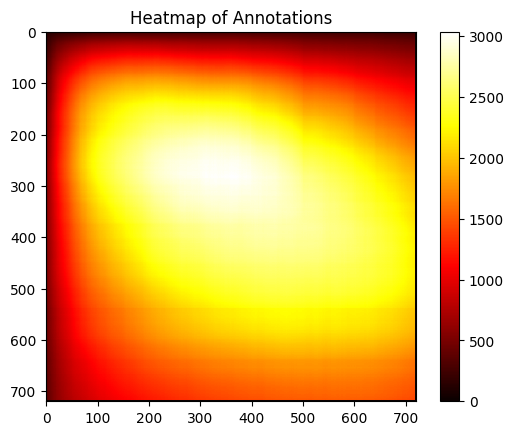

In [24]:
# Get heatmaps
heatmaps = create_heatmaps(annotation_dir)

# Plot heatmaps
plot_heatmaps(heatmaps)

### Convertion

In [17]:
# Function to convert XML annotation to YOLO format
def convert_annotation(xml_file, img_width, img_height):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    yolo_annotations = []
    
    for obj in root.iter('object'):
        label = obj.find('name').text
        if label not in classes:
            continue  # Skip if label is not in our defined classes
            
        class_id = classes.index(label)
        xmlbox = obj.find('bndbox')
        xmin = int(xmlbox.find('xmin').text)
        ymin = int(xmlbox.find('ymin').text)
        xmax = int(xmlbox.find('xmax').text)
        ymax = int(xmlbox.find('ymax').text)

        # Calculate YOLO format (normalized values)
        x_center = ((xmin + xmax) / 2.0) / img_width
        y_center = ((ymin + ymax) / 2.0) / img_height
        width = (xmax - xmin) / img_width
        height = (ymax - ymin) / img_height

        yolo_annotations.append(f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}")
    
    return yolo_annotations

In [18]:
# Function to load image size
def get_image_size(image_path):
    image = cv2.imread(image_path)
    height, width = image.shape[:2]
    return width, height

# Convert all XML annotations in the directory to YOLO format
def convert_all_annotations(image_dir, annotation_dir, output_annotation_dir):
    for xml_file in os.listdir(annotation_dir):
        if not xml_file.endswith('.xml'):
            continue

        image_file = xml_file.replace('.xml', '.jpg')
        image_path = os.path.join(image_dir, image_file)
        annotation_path = os.path.join(annotation_dir, xml_file)

        if not os.path.exists(image_path):
            print(f"Image not found: {image_path}")
            continue

        # Get image dimensions
        img_width, img_height = get_image_size(image_path)

        # Convert annotations to YOLO format
        yolo_annotations = convert_annotation(annotation_path, img_width, img_height)

        # Write annotations to a new .txt file
        output_txt_path = os.path.join(output_annotation_dir, xml_file.replace('.xml', '.txt'))
        with open(output_txt_path, 'w') as f:
            f.write("\n".join(yolo_annotations))

In [19]:
# Create output directory if not exists
os.makedirs(output_annotation_dir, exist_ok=True)

# Convert all annotations
convert_all_annotations(image_dir, annotation_dir, output_annotation_dir)

Image not found: Train Images\bus 351.jpg
Image not found: Train Images\bus 352.jpg
Image not found: Train Images\mixed (437).jpg
Image not found: Train Images\mixed (904).jpg
Image not found: Train Images\mixed (911).jpg
Image not found: Train Images\mixed (912).jpg
Image not found: Train Images\mixed (913).jpg
Image not found: Train Images\truck (685).jpg
Image not found: Train Images\truck (687).jpg
Image not found: Train Images\truck (688).jpg
Image not found: Train Images\truck (689).jpg
Image not found: Train Images\truck (69).jpg
Image not found: Train Images\truck (690).jpg
Image not found: Train Images\van (256).jpg


## **Data Preprocessing**

### Normailization

In [13]:
# Paths to your dataset
train_image_dir = 'datasets/train/images'
val_image_dir = 'datasets/val/images'
train_annotation_dir = 'datasets/train/labels'
val_annotation_dir = 'datasets/val/labels'

In [14]:
# Create directories if they do not exist
os.makedirs(train_image_dir, exist_ok=True)
os.makedirs(val_image_dir, exist_ok=True)
os.makedirs(train_annotation_dir, exist_ok=True)
os.makedirs(val_annotation_dir, exist_ok=True)

In [15]:
# Function to normalize an image
def normalize_image(image):
    image = image / 255.0  # Normalize to [0, 1]
    return image

In [16]:
# Function to parse XML annotation
def parse_annotation(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    boxes = []
    labels = []
    for obj in root.iter('object'):
        label = obj.find('name').text
        xmlbox = obj.find('bndbox')
        b = (int(xmlbox.find('xmin').text), int(xmlbox.find('ymin').text), 
             int(xmlbox.find('xmax').text), int(xmlbox.find('ymax').text))
        boxes.append(b)
        labels.append(label)
    return labels

In [17]:
# Get list of all image and annotation files
image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg')]
annotation_files = [f for f in os.listdir(annotation_dir) if f.endswith('.txt')]

### Splitting

In [19]:
# Split data into train and validation sets
train_images, val_images = train_test_split(image_files, test_size=0.2, random_state=42)

In [26]:
## Process images and annotations
for image_file in image_files:
    image_path = os.path.join(image_dir, image_file)
    annotation_txt_path = os.path.join(annotation_dir, image_file.replace('.jpg', '.txt'))
    annotation_xml_path = os.path.join(annotation_dir, image_file.replace('.jpg', '.xml'))
    
    # Read and normalize image
    image = cv2.imread(image_path)
    normalized_image = normalize_image(image)
    
    # Determine destination paths for images and annotations
    if image_file in train_images:
        dest_image_path = os.path.join(train_image_dir, image_file)
        dest_annotation_txt_path = os.path.join(train_annotation_dir, image_file.replace('.jpg', '.txt'))
        dest_annotation_xml_path = os.path.join(train_annotation_dir, image_file.replace('.jpg', '.xml'))
    else:
        dest_image_path = os.path.join(val_image_dir, image_file)
        dest_annotation_txt_path = os.path.join(val_annotation_dir, image_file.replace('.jpg', '.txt'))
        dest_annotation_xml_path = os.path.join(val_annotation_dir, image_file.replace('.jpg', '.xml'))
    
    # Save the normalized image
    cv2.imwrite(dest_image_path, (normalized_image * 255).astype(np.uint8))
    
    # Copy annotation files (.txt and .xml) to the respective directory if they exist
    if os.path.exists(annotation_txt_path):
        shutil.copy(annotation_txt_path, dest_annotation_txt_path)
    if os.path.exists(annotation_xml_path):
        shutil.copy(annotation_xml_path, dest_annotation_xml_path)

In [ ]:
# Function to parse YOLO format annotation and count class occurrences
def count_classes(annotation_dir, classes):
    class_counts = Counter()
    for file in os.listdir(annotation_dir):
        if file.endswith('.txt'):
            with open(os.path.join(annotation_dir, file), 'r') as f:
                for line in f:
                    class_id = int(line.strip().split()[0])
                    class_name = classes[class_id]
                    class_counts[class_name] += 1
    return class_counts

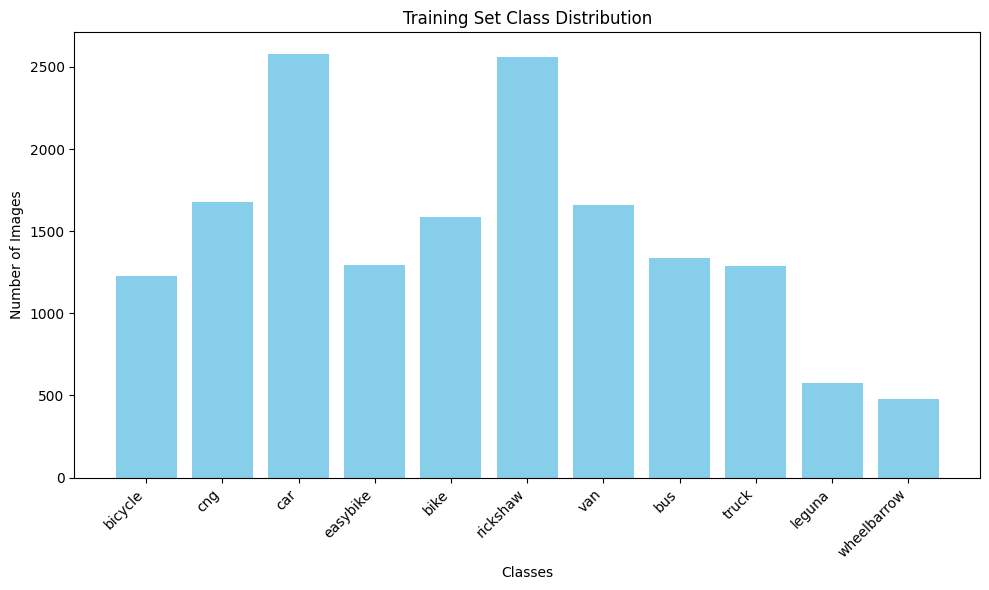

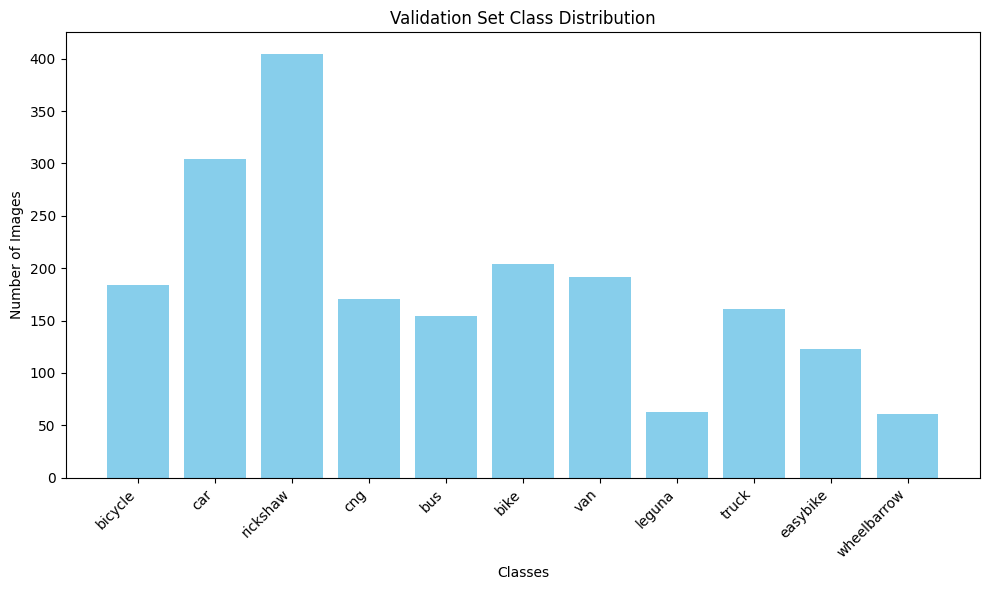

In [21]:
# Count classes in train and val directories
train_class_counts = count_classes(train_annotation_dir, classes)
val_class_counts = count_classes(val_annotation_dir, classes)

# Plotting function
def plot_class_distribution(class_counts, title):
    class_names = list(class_counts.keys())
    class_freqs = list(class_counts.values())
    
    plt.figure(figsize=(10, 6))
    plt.bar(class_names, class_freqs, color='skyblue')
    plt.xlabel('Classes')
    plt.ylabel('Number of Images')
    plt.title(title)
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()

# Plot the distribution for both train and val sets
plot_class_distribution(train_class_counts, 'Training Set Class Distribution')
plot_class_distribution(val_class_counts, 'Validation Set Class Distribution')


In [ ]:
# Function to count the images per class based on annotation files
def count_images_per_class(annotation_dir, classes):
    class_count = {cls: 0 for cls in classes}

    # Loop through all annotation files
    for annotation_file in os.listdir(annotation_dir):
        if annotation_file.endswith(".txt"):
            annotation_path = os.path.join(annotation_dir, annotation_file)
            
            # Open and read the annotation file
            with open(annotation_path, 'r') as f:
                annotations = f.readlines()
                
                # Each line corresponds to an object in the image
                for annotation in annotations:
                    class_id = int(annotation.split()[0])  # First number is class ID
                    class_count[classes[class_id]] += 1
    
    return class_count

# Count images for train and val sets
train_class_counts = count_images_per_class(train_annotation_dir, classes)
val_class_counts = count_images_per_class(val_annotation_dir, classes)

In [ ]:
# Convert counts to percentages
def counts_to_percentage(counts_dict):
    total = sum(counts_dict.values())
    return {cls: (count / total) * 100 for cls, count in counts_dict.items()}

train_percentages = counts_to_percentage(train_class_counts)
val_percentages = counts_to_percentage(val_class_counts)

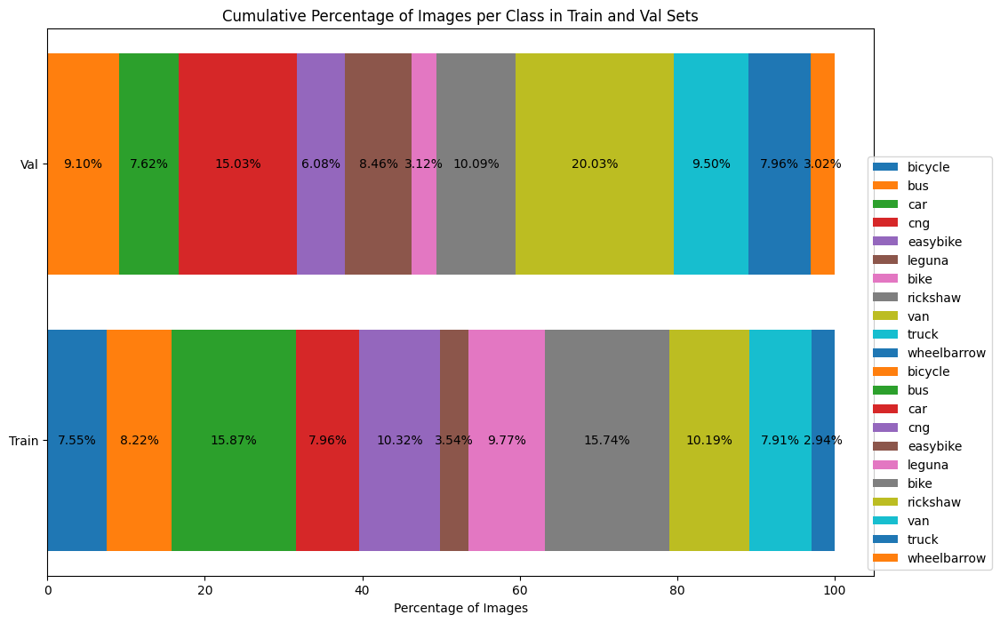

In [52]:
# Plot stacked horizontal bar chart
def plot_stacked_bar_chart(train_data, val_data, classes):
    train_cumulative = np.cumsum([train_data[cls] for cls in classes])
    val_cumulative = np.cumsum([val_data[cls] for cls in classes])

    # Create figure and axis
    fig, ax = plt.subplots(figsize=(12, 8))

    # Plot train percentages
    left = np.zeros(len(classes))
    for cls in classes:
        ax.barh("Train", train_data[cls], left=left, label=cls)
        left += train_data[cls]
        ax.text(left[-1] - train_data[cls] / 2, "Train", f'{train_data[cls]:.2f}%', 
                ha='center', va='center')

    # Plot val percentages
    left = np.zeros(len(classes))
    for cls in classes:
        ax.barh("Val", val_data[cls], left=left, label=cls)
        left += val_data[cls]
        ax.text(left[-1] - val_data[cls] / 2, "Val", f'{val_data[cls]:.2f}%', 
                ha='center', va='center')

    # Add labels, title, and legend
    ax.set_xlabel('Percentage of Images')
    ax.set_title('Cumulative Percentage of Images per Class in Train and Val Sets')
    ax.legend(loc='lower right', bbox_to_anchor=(1.15, 0))

    plt.show()

# Plot the horizontal chart
plot_stacked_bar_chart(train_percentages, val_percentages, classes)


In [53]:
# Function to count images per class based on annotation files
def count_images_per_class(annotation_dir, classes):
    class_count = {cls: 0 for cls in classes}

    # Loop through annotation files in the directory
    for annotation_file in os.listdir(annotation_dir):
        if annotation_file.endswith(".txt"):
            annotation_path = os.path.join(annotation_dir, annotation_file)

            # Read each annotation file
            with open(annotation_path, 'r') as f:
                annotations = f.readlines()

                # Increment the respective class count
                for annotation in annotations:
                    class_id = int(annotation.split()[0])  # First value is class ID
                    class_count[classes[class_id]] += 1

    return class_count

# Count images in train and val sets
train_class_counts = count_images_per_class(train_annotation_dir, classes)
val_class_counts = count_images_per_class(val_annotation_dir, classes)

# Function to convert counts to percentages
def counts_to_percentage(counts_dict):
    total = sum(counts_dict.values())
    return {cls: (count / total) * 100 for cls, count in counts_dict.items()}

# Convert counts to percentages for both sets
train_percentages = counts_to_percentage(train_class_counts)
val_percentages = counts_to_percentage(val_class_counts)

# Create a DataFrame for better visualization and saving as CSV
def create_dataframe(train_data, val_data):
    data = {
        "Class": classes,
        "Train Count": [train_class_counts[cls] for cls in classes],
        "Val Count": [val_class_counts[cls] for cls in classes],
        "Train %": [train_percentages[cls] for cls in classes],
        "Val %": [val_percentages[cls] for cls in classes],
    }
    df = pd.DataFrame(data)
    return df

# Create DataFrame and save it as CSV
df = create_dataframe(train_class_counts, val_class_counts)
print(df)  # Optional: Print the table to check it

# Save the table as CSV
df.to_csv('class_distribution.csv', index=False)
print("CSV saved as 'class_distribution.csv'")

          Class  Train Count  Val Count    Train %      Val %
0       bicycle         1228        184   7.549026   9.099901
1           bus         1337        154   8.219094   7.616222
2           car         2581        304  15.866478  15.034619
3           cng         1295        123   7.960902   6.083086
4      easybike         1678        171  10.315362   8.456973
5        leguna          576         63   3.540911   3.115727
6          bike         1589        204   9.768242  10.089021
7      rickshaw         2561        405  15.743530  20.029674
8           van         1657        192  10.186267   9.495549
9         truck         1286        161   7.905576   7.962413
10  wheelbarrow          479         61   2.944612   3.016815
CSV saved as 'class_distribution.csv'


## **Model Configuration**

### GPU check

In [6]:
import torch

print(torch.__version__)
print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0))  # This will print the name of your GPU

2.4.1+cu121
True
NVIDIA GeForce RTX 2060 SUPER


In [7]:
# Check if GPU is available
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Using device: {device}')

Using device: cuda


### YOLO v8 Model

In [8]:
# YOLOv8 configuration
config = {
    'epochs': 100,  # Number of epochs
    'imgsz': 640,  # Image size
    'device': device  # Device to use
}
# Set hyperparameters
hyperparameters = {
    'lr0': 0.01,  # Initial learning rate
    'lrf': 0.2,   # Final learning rate (fraction of initial)
    'momentum': 0.937,
    'weight_decay': 0.0005,
    'warmup_epochs': 3.0,
    'warmup_momentum': 0.8,
    'warmup_bias_lr': 0.1,
    'box': 0.05,  # box loss gain
    'cls': 0.5,   # cls loss gain
    'cls_pw': 1.0,  # cls BCELoss positive_weight
    'obj': 1.0,  # obj loss gain
    'obj_pw': 1.0,  # obj BCELoss positive_weight
    'iou_t': 0.2,  # IoU training threshold
    'anchor_t': 4.0,  # anchor-multiple threshold
    'fl_gamma': 0.0,  # focal loss gamma (efficientDet default gamma=1.5)
    'hsv_h': 0.015,  # image HSV-Hue augmentation (fraction)
    'hsv_s': 0.7,  # image HSV-Saturation augmentation (fraction)
    'hsv_v': 0.4,  # image HSV-Value augmentation (fraction)
    'degrees': 0.0,  # image rotation (+/- deg)
    'translate': 0.1,  # image translation (+/- fraction)
    'scale': 0.5,  # image scale (+/- gain)
    'shear': 0.0,  # image shear (+/- deg)
    'perspective': 0.0,  # image perspective (+/- fraction), range 0-0.001
    'flipud': 0.0,  # image flip up-down (probability)
    'fliplr': 0.5,  # image flip left-right (probability)
    'mixup': 0.0  # image mixup (probability)
}

In [9]:
# Initialize YOLOv8 model
model = YOLO('yolov8n.pt')

In [10]:
# Train the model
model.train(data='traffic_update.yaml', epochs=config['epochs'], device=config['device'])

New https://pypi.org/project/ultralytics/8.2.102 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.90  Python-3.11.8 torch-2.4.1+cu121 CUDA:0 (NVIDIA GeForce RTX 2060 SUPER, 8192MiB)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=traffic_update.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train25, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=

train: Scanning E:\OneDrive - northsouth.edu\University\CSE498R\Project\Dhaka-Roads-Traffic-Detection-using-YOLOV8-main\Dhaka-Roads-Traffic-Detection-using-YOLOV8-main\datasets\train\labels.cache... 5662 images, 86 backgrounds, 5 corrupt: 100%|██████████| 5662/5662 [00:00<?, ?it/s]

train: WARNING  E:\OneDrive - northsouth.edu\University\CSE498R\Project\Dhaka-Roads-Traffic-Detection-using-YOLOV8-main\Dhaka-Roads-Traffic-Detection-using-YOLOV8-main\datasets\train\images\easybike (429).jpg: corrupt JPEG restored and saved
train: WARNING  E:\OneDrive - northsouth.edu\University\CSE498R\Project\Dhaka-Roads-Traffic-Detection-using-YOLOV8-main\Dhaka-Roads-Traffic-Detection-using-YOLOV8-main\datasets\train\images\mixed (120).jpg: 1 duplicate labels removed
train: WARNING  E:\OneDrive - northsouth.edu\University\CSE498R\Project\Dhaka-Roads-Traffic-Detection-using-YOLOV8-main\Dhaka-Roads-Traffic-Detection-using-YOLOV8-main\datasets\train\images\mixed (817).jpg: corrupt JPEG restored and saved
train: WARNING  E:\OneDrive - northsouth.edu\University\CSE498R\Project\Dhaka-Roads-Traffic-Detection-using-YOLOV8-main\Dhaka-Roads-Traffic-Detection-using-YOLOV8-main\datasets\train\images\mixed (853).jpg: corrupt JPEG restored and saved
train: WARNING  E:\OneDrive - northsouth.edu\U


val: Scanning E:\OneDrive - northsouth.edu\University\CSE498R\Project\Dhaka-Roads-Traffic-Detection-using-YOLOV8-main\Dhaka-Roads-Traffic-Detection-using-YOLOV8-main\datasets\val\labels.cache... 708 images, 9 backgrounds, 0 corrupt: 100%|██████████| 708/708 [00:00<?, ?it/s]

val: WARNING  E:\OneDrive - northsouth.edu\University\CSE498R\Project\Dhaka-Roads-Traffic-Detection-using-YOLOV8-main\Dhaka-Roads-Traffic-Detection-using-YOLOV8-main\datasets\val\images\cng (389).jpg: corrupt JPEG restored and saved


Plotting labels to runs\detect\train25\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 6 dataloader workers
Logging results to runs\detect\train25
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/354 [00:00<?, ?it/s]


RuntimeError: CUDA error: device-side assert triggered
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.


In [3]:
!yolo task='detect' mode='val' model= "best.pt" data = "traffic_update.yaml"

'yolo' is not recognized as an internal or external command,
operable program or batch file.


### Detection

In [2]:
# Load the trained model
model = YOLO("runs\\detect\\train22\\weights\\last.pt")

In [3]:
# Function to count vehicles in an image
def count_vehicles(image_path):
    # Load the image
    img = cv2.imread(image_path)
    # Perform inference
    results = model(img)

    # Extract the detections
    detections = results[0].boxes.xyxy.cpu().numpy()  # Get bounding boxes and move to CPU
    labels = results[0].boxes.cls.cpu().numpy()  # Get class labels and move to CPU
    confidences = results[0].boxes.conf.cpu().numpy()  # Get confidence scores and move to CPU

    # Assuming your model labels are mapped to the following class names
    vehicle_classes = ["bicycle", "bus", "car", "easybike", "leguna", "bike", "rickshaw", "van", "truck","wheelbarrow"]
    
    # Filter for vehicle detections
    vehicle_detections = []
    for bbox, label, confidence in zip(detections, labels, confidences):
        if vehicle_classes[int(label)] in vehicle_classes:
            vehicle_detections.append((bbox, vehicle_classes[int(label)], confidence))

    # Count the vehicles
    vehicle_count = len(vehicle_detections)

    return vehicle_count, img, vehicle_detections

In [4]:
# Function to classify congestion level based on vehicle count
def classify_congestion(vehicle_count):
    if vehicle_count < 10:
        return "Low"
    elif vehicle_count < 20:
        return "Medium"
    else:
        return "High"

In [5]:
# Test the functions with an example image
image_path = "Test\WhatsApp Image 2024-09-07 at 12.46.40_c5ff8f5a.jpg"  # Replace with the actual path
vehicle_count, img, vehicle_detections = count_vehicles(image_path)
congestion_level = classify_congestion(vehicle_count)
print(f"Number of vehicles detected: {vehicle_count}")
print(f"Traffic congestion level: {congestion_level}")


0: 640x480 9 buss, 11 cars, 1 bike, 1 rickshaw, 1 van, 44.0ms
Speed: 5.0ms preprocess, 44.0ms inference, 293.4ms postprocess per image at shape (1, 3, 640, 480)
Number of vehicles detected: 23
Traffic congestion level: High


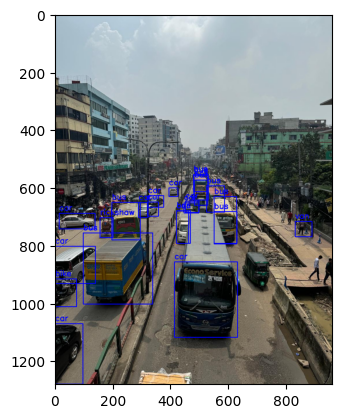

In [6]:
# Display the image with detections
for bbox, label, confidence in vehicle_detections:
    x1, y1, x2, y2 = bbox
    cv2.rectangle(img, (int(x1), int(y1)), (int(x2), int(y2)), (255, 0, 0), 2)
    cv2.putText(img, label, (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)

plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.show()

## **Evaluation**

In [7]:
# Load the trained model
model = YOLO('runs\\detect\\train22\\weights\\best.pt')

### Accuracy

In [8]:
# Validate the model
metrics = model.val()

# Print out all available attributes and methods to inspect the metrics object
print(dir(metrics))

# Accessing metrics from the metrics object
f1_score = metrics.f1  # F1 score
precision = metrics.precision  # Precision
recall = metrics.recall  # Recall
map_50 = metrics.map50  # mAP@0.5
map_75 = metrics.map75  # mAP@0.75
map = metrics.map  # mAP

# Printing the metrics
print(f"F1 Score: {f1_score}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"mAP@0.5: {map_50}")
print(f"mAP@0.75: {map_75}")
print(f"mAP: {map}")


Ultralytics YOLOv8.2.90  Python-3.11.8 torch-2.4.1+cu121 CUDA:0 (NVIDIA GeForce RTX 2060 SUPER, 8192MiB)
Model summary (fused): 168 layers, 3,007,598 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning E:\OneDrive - northsouth.edu\University\CSE498R\Project\Dhaka-Roads-Traffic-Detection-using-YOLOV8-main\Dhaka-Roads-Traffic-Detection-using-YOLOV8-main\datasets\val\labels.cache... 1416 images, 66 backgrounds, 0 corrupt: 100%|██████████| 1416/1416 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:31<00:00,  2.79it/s]


                   all       1416       3642      0.912      0.811      0.889      0.652
               bicycle        190        378      0.909      0.799      0.889      0.597
                   bus        177        310      0.872      0.746      0.842      0.628
                   car        356        606      0.898      0.767      0.863       0.62
              easybike        160        282      0.942       0.87      0.929      0.735
                leguna         66        150      0.942      0.827      0.899      0.764
                  bike        301        412      0.934      0.813      0.908      0.662
              rickshaw        289        681      0.892      0.753      0.845      0.563
                   van        220        349      0.931      0.817      0.906      0.653
                 truck        231        351      0.916      0.863      0.918      0.688
           wheelbarrow         76        123      0.882      0.853      0.893      0.614
Speed: 0.3ms preproce

AttributeError: 'DetMetrics' object has no attribute 'f1'. See valid attributes below.

    Utility class for computing detection metrics such as precision, recall, and mean average precision (mAP) of an
    object detection model.

    Args:
        save_dir (Path): A path to the directory where the output plots will be saved. Defaults to current directory.
        plot (bool): A flag that indicates whether to plot precision-recall curves for each class. Defaults to False.
        on_plot (func): An optional callback to pass plots path and data when they are rendered. Defaults to None.
        names (dict of str): A dict of strings that represents the names of the classes. Defaults to an empty tuple.

    Attributes:
        save_dir (Path): A path to the directory where the output plots will be saved.
        plot (bool): A flag that indicates whether to plot the precision-recall curves for each class.
        on_plot (func): An optional callback to pass plots path and data when they are rendered.
        names (dict of str): A dict of strings that represents the names of the classes.
        box (Metric): An instance of the Metric class for storing the results of the detection metrics.
        speed (dict): A dictionary for storing the execution time of different parts of the detection process.

    Methods:
        process(tp, conf, pred_cls, target_cls): Updates the metric results with the latest batch of predictions.
        keys: Returns a list of keys for accessing the computed detection metrics.
        mean_results: Returns a list of mean values for the computed detection metrics.
        class_result(i): Returns a list of values for the computed detection metrics for a specific class.
        maps: Returns a dictionary of mean average precision (mAP) values for different IoU thresholds.
        fitness: Computes the fitness score based on the computed detection metrics.
        ap_class_index: Returns a list of class indices sorted by their average precision (AP) values.
        results_dict: Returns a dictionary that maps detection metric keys to their computed values.
        curves: TODO
        curves_results: TODO
    

In [7]:
# Assuming you have a log file or data from training
log_file = 'runs\\detect\\train18\\results.csv'
log_data = pd.read_csv(log_file)

# Plot training and testing accuracy
plt.figure(figsize=(10, 6))
plt.plot(log_data['epoch'], log_data['train/accuracy'], label='Training Accuracy')
plt.plot(log_data['epoch'], log_data['val/accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

KeyError: 'epoch'

### Confusion Matrix

In [9]:
# Perform inference on the validation set
results = model.val()

# Assuming `results.boxes` contains bounding boxes and class labels
predicted_labels = []
true_labels = []

# Loop through results (you may need to adjust based on what `results` contains)
for pred in results.pred:
    # Extract predicted class labels (if class labels are in index 5)
    predicted_labels += pred[:, 5].tolist()

# Assuming you have a method or a way to get true labels
for img in results.images:
    true_labels += get_true_labels(img)  # Implement or use the appropriate function to extract true labels

# Now true_labels and predicted_labels contain the data needed for comparison

Ultralytics YOLOv8.2.90  Python-3.11.8 torch-2.4.1+cu121 CUDA:0 (NVIDIA GeForce RTX 2060 SUPER, 8192MiB)


val: Scanning E:\OneDrive - northsouth.edu\University\CSE498R\Project\Dhaka-Roads-Traffic-Detection-using-YOLOV8-main\Dhaka-Roads-Traffic-Detection-using-YOLOV8-main\datasets\val\labels.cache... 1416 images, 66 backgrounds, 0 corrupt: 100%|██████████| 1416/1416 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 89/89 [00:29<00:00,  3.04it/s]


                   all       1416       3642      0.912      0.811      0.889      0.652
               bicycle        190        378      0.909      0.799      0.889      0.597
                   bus        177        310      0.872      0.746      0.842      0.628
                   car        356        606      0.898      0.767      0.863       0.62
              easybike        160        282      0.942       0.87      0.929      0.735
                leguna         66        150      0.942      0.827      0.899      0.764
                  bike        301        412      0.934      0.813      0.908      0.662
              rickshaw        289        681      0.892      0.753      0.845      0.563
                   van        220        349      0.931      0.817      0.906      0.653
                 truck        231        351      0.916      0.863      0.918      0.688
           wheelbarrow         76        123      0.882      0.853      0.893      0.614
Speed: 0.4ms preproce

AttributeError: 'DetMetrics' object has no attribute 'pred'. See valid attributes below.

    Utility class for computing detection metrics such as precision, recall, and mean average precision (mAP) of an
    object detection model.

    Args:
        save_dir (Path): A path to the directory where the output plots will be saved. Defaults to current directory.
        plot (bool): A flag that indicates whether to plot precision-recall curves for each class. Defaults to False.
        on_plot (func): An optional callback to pass plots path and data when they are rendered. Defaults to None.
        names (dict of str): A dict of strings that represents the names of the classes. Defaults to an empty tuple.

    Attributes:
        save_dir (Path): A path to the directory where the output plots will be saved.
        plot (bool): A flag that indicates whether to plot the precision-recall curves for each class.
        on_plot (func): An optional callback to pass plots path and data when they are rendered.
        names (dict of str): A dict of strings that represents the names of the classes.
        box (Metric): An instance of the Metric class for storing the results of the detection metrics.
        speed (dict): A dictionary for storing the execution time of different parts of the detection process.

    Methods:
        process(tp, conf, pred_cls, target_cls): Updates the metric results with the latest batch of predictions.
        keys: Returns a list of keys for accessing the computed detection metrics.
        mean_results: Returns a list of mean values for the computed detection metrics.
        class_result(i): Returns a list of values for the computed detection metrics for a specific class.
        maps: Returns a dictionary of mean average precision (mAP) values for different IoU thresholds.
        fitness: Computes the fitness score based on the computed detection metrics.
        ap_class_index: Returns a list of class indices sorted by their average precision (AP) values.
        results_dict: Returns a dictionary that maps detection metric keys to their computed values.
        curves: TODO
        curves_results: TODO
    

In [10]:
# Compute confusion matrix
cm = confusion_matrix(true_labels, predicted_labels, labels=np.unique(true_labels))

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=np.unique(true_labels))
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

ValueError: 'labels' should contains at least one label.

### ROC Curve

In [3]:
# Assuming true_labels and predicted_probabilities are defined
n_classes = len(np.unique(true_labels))
true_labels_bin = label_binarize(true_labels, classes=np.arange(n_classes))
predicted_probabilities = model.predict_proba(validation_images)  # Use your model's method to get probabilities

NameError: name 'true_labels' is not defined

In [17]:
# Compute ROC curve and ROC AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(true_labels_bin[:, i], predicted_probabilities[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curve
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (area = {roc_auc[i]:.2f})')

In [18]:
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()

C:\Users\kazbe\AppData\Local\Temp\ipykernel_2832\2482184972.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='lower right')


<Figure size 640x480 with 1 Axes>

# **Detectron2 Model**

## **Libraries**

In [8]:
import os
import json
import cv2
import torch
import detectron2
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.utils.visualizer import Visualizer
from detectron2.data.datasets import register_coco_instances
from detectron2.evaluation import COCOEvaluator
from detectron2.engine import DefaultPredictor
from detectron2.structures import BoxMode
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

## **Data Preparation**

In [9]:
#Register the Dataset
train_images_path = "datasets/train/images"
train_annotations_path = "datasets/train/annotations/train_annotations.json"

val_images_path = "datasets/val/images"
val_annotations_path = "datasets/val/annotations/val_annotations.json"

In [35]:
annotation_file = "datasets/val/data_annotations.json"
images_dir = "datasets/val/images"

with open(annotation_file, 'r') as f:
    coco_data = json.load(f)

for img in coco_data['images']:
    img_path = os.path.join(images_dir, img['file_name'])
    image = cv2.imread(img_path)
    if image is not None:
        height, width, _ = image.shape
        img['height'] = height
        img['width'] = width
    else:
        print(f"Image {img['file_name']} could not be loaded.")

with open('datasets/val/val_annotations.json', 'w') as f:
    json.dump(coco_data, f)

print("Annotation file updated with correct image dimensions.")

Annotation file updated with correct image dimensions.


In [10]:
# Unregister the dataset if it's already registered
if "vehicle_train" in MetadataCatalog.list():
    MetadataCatalog.remove("vehicle_train")

if "vehicle_val" in MetadataCatalog.list():
    MetadataCatalog.remove("vehicle_val")

# Now register the dataset
register_coco_instances("vehicle_train", {}, train_annotations_path, train_images_path)
register_coco_instances("vehicle_val", {}, val_annotations_path, val_images_path)

## **Model**

In [11]:
# Step 2: Setup Config
cfg = get_cfg()
cfg.merge_from_file(detectron2.model_zoo.get_config_file("COCO-Detection/retinanet_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("vehicle_train",)
cfg.DATASETS.TEST = ("vehicle_val",)  # For evaluation
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = detectron2.model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 20000  # adjust iterations based on dataset size
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 16  # Number of vehicle classes
cfg.OUTPUT_DIR = "./output_vehicle_detectron2_2"

Loading config c:\users\kazbe\detectron2\detectron2\model_zoo\configs\COCO-Detection\../Base-RetinaNet.yaml with yaml.unsafe_load. Your machine may be at risk if the file contains malicious content.


In [12]:
# Step 3: Train the Model
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[10/02 19:05:43 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

Some model parameters or buffers are not found in the checkpoint:
backbone.top_block.p6.{bias, weight}
backbone.top_block.p7.{bias, weight}
head.bbox_pred.{bias, weight}
head.bbox_subnet.0.{bias, weight}
head.bbox_subnet.2.{bias, weight}
head.bbox_subnet.4.{bias, weight}
head.bbox_subnet.6.{bias, weight}
head.cls_score.{bias, weight}
head.cls_subnet.0.{bias, weight}
head.cls_subnet.2.{bias, weight}
head.cls_subnet.4.{bias, weight}
head.cls_subnet.6.{bias, weight}
The checkpoint state_dict contains keys that are not used by the model:
  proposal_generator.rpn_head.conv.{bias, weight}
  proposal_generator.rpn_head.objectness_logits.{bias, weight}
  proposal_generator.rpn_head.anchor_deltas.{bias, weight}
  roi_heads.box_head.fc1.{bias, weight}
  roi_heads.box_head.fc2.{bias, weight}
  roi_heads.box_predictor.cls_score.{bias, weight}
  roi_heads.box_predictor.bbox_pred.{bias, weight}
  backbone.fpn_lateral2.{bias, weight}
  backbone.fpn_output2.{bias, weight}


[10/02 19:05:45 d2.engine.train_loop]: Starting training from iteration 0
[10/02 19:06:04 d2.utils.events]:  eta: 2:14:49  iter: 19  total_loss: 2.358  loss_cls: 1.533  loss_box_reg: 0.8248    time: 0.5776  last_time: 0.4068  data_time: 0.3597  last_data_time: 0.0013   lr: 4.9953e-06  max_mem: 3580M
[10/02 19:06:13 d2.utils.events]:  eta: 2:20:52  iter: 39  total_loss: 1.636  loss_cls: 1.087  loss_box_reg: 0.549    time: 0.5196  last_time: 0.4489  data_time: 0.0534  last_data_time: 0.0026   lr: 9.9902e-06  max_mem: 3580M
[10/02 19:06:23 d2.utils.events]:  eta: 2:22:06  iter: 59  total_loss: 1.87  loss_cls: 1.221  loss_box_reg: 0.6529    time: 0.5041  last_time: 0.4077  data_time: 0.0508  last_data_time: 0.0015   lr: 1.4985e-05  max_mem: 3580M
[10/02 19:06:31 d2.utils.events]:  eta: 2:20:01  iter: 79  total_loss: 1.586  loss_cls: 1.039  loss_box_reg: 0.5457    time: 0.4788  last_time: 0.3562  data_time: 0.0144  last_data_time: 0.0013   lr: 1.998e-05  max_mem: 3580M
[10/02 19:06:38 d2.ut

## **Evalution**

In [13]:
# Load the model
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # Set threshold for inference
cfg.DATASETS.TEST = ("vehicle_val", )

In [14]:
# Step 4: Validation and Testing
evaluator = COCOEvaluator("vehicle_val", output_dir="./output_vehicle_detectron2/")
val_loader = build_detection_test_loader(cfg, "vehicle_val")

# Perform inference and evaluate on validation set
metrics = inference_on_dataset(trainer.model, val_loader, evaluator)

# Print evaluation metrics
print(metrics)

WARNING [10/02 21:14:28 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[10/02 21:14:28 d2.data.datasets.coco]: Loaded 708 images in COCO format from datasets/val/annotations/val_annotations.json
[10/02 21:14:28 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[10/02 21:14:28 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[10/02 21:14:28 d2.data.common]: Serializing 708 elements to byte tensors and concatenating them all ...
[10/02 21:14:28 d2.data.common]: Serialized dataset takes 0.20 MiB
[10/02 21:14:28 d2.evaluation.evaluator]: Start inference on 708 batches
[10/02 21:14:34 d2.evaluation.evaluator]: Inference done 11/708. Dataloading: 0.0006 s/iter. Inference: 0.0930 s/iter. Eval: 0.0003 s/iter. Total: 0.0939 s/iter. ETA=0:01:05
[10/02 21:14:39 d2.eva

In [45]:
# Step 5: Inference with Trained Model
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set a threshold for inference
predictor = DefaultPredictor(cfg)

[09/27 19:08:12 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output_vehicle_detection\model_final.pth ...


c:\Users\kazbe\AppData\Local\Programs\Python\Python311\Lib\site-packages\fvcore\common\checkpoint.py:254: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(cas

In [54]:
with open('output_vehicle_detection\metrics.json', 'r') as f:
    print(f.read())

{"data_time": 0.0016022500003600726, "eta_seconds": 1071.860554998093, "fast_rcnn/cls_accuracy": 0.07421875, "fast_rcnn/false_negative": 0.019176136363636364, "fast_rcnn/fg_cls_accuracy": 0.026988636363636364, "iteration": 19, "loss_box_reg": 0.6757011413574219, "loss_cls": 2.746817111968994, "loss_rpn_cls": 0.021043813787400723, "loss_rpn_loc": 0.01530841551721096, "lr": 4.99525e-06, "rank_data_time": 0.0016022500003600726, "roi_head/num_bg_samples": 104.0, "roi_head/num_fg_samples": 24.0, "rpn/num_neg_anchors": 244.0, "rpn/num_pos_anchors": 12.0, "time": 0.35968474999936006, "total_loss": 3.4664600626565516}
{"data_time": 0.0014143500002319342, "eta_seconds": 996.9208959971729, "fast_rcnn/cls_accuracy": 0.1953125, "fast_rcnn/false_negative": 0.11437908496732026, "fast_rcnn/fg_cls_accuracy": 0.015625, "iteration": 39, "loss_box_reg": 0.699419379234314, "loss_cls": 2.6624683141708374, "loss_rpn_cls": 0.027796145528554916, "loss_rpn_loc": 0.01184497494250536, "lr": 9.99025e-06, "rank_da

In [57]:
import json
import matplotlib.pyplot as plt

# Simulated log data; replace this with loading from a file if needed
log_data = """
{"data_time": 0.0016719000004741247, "eta_seconds": 102.9198940000424, "fast_rcnn/cls_accuracy": 0.94140625, "fast_rcnn/false_negative": 0.14809027777777778}
{"data_time": 0.0016917499988267082, "eta_seconds": 95.45095300021785, "fast_rcnn/cls_accuracy": 0.9375, "fast_rcnn/false_negative": 0.16145281018027574}
{"data_time": 0.0016512499996679253, "eta_seconds": 88.1085720002011, "fast_rcnn/cls_accuracy": 0.908203125, "fast_rcnn/false_negative": 0.1925580079230334}
{"data_time": 0.0018319499995413935, "eta_seconds": 80.76619100018434, "fast_rcnn/cls_accuracy": 0.9140625, "fast_rcnn/false_negative": 0.1475452196382429}
{"data_time": 0.0014662500007034396, "eta_seconds": 73.3110499999384, "fast_rcnn/cls_accuracy": 0.919921875, "fast_rcnn/false_negative": 0.23963647959183673}
{"data_time": 0.001374000000396336, "eta_seconds": 65.85057000018423, "fast_rcnn/cls_accuracy": 0.9453125, "fast_rcnn/false_negative": 0.12916666666666665}
{"data_time": 0.0015986999997039675, "eta_seconds": 58.533840000163764, "fast_rcnn/cls_accuracy": 0.916015625, "fast_rcnn/false_negative": 0.15625}
{"data_time": 0.0015934500006551389, "eta_seconds": 51.15161099989564, "fast_rcnn/cls_accuracy": 0.943359375, "fast_rcnn/false_negative": 0.12983630952380953}
{"data_time": 0.17493854999975156, "eta_seconds": 43.90038000012282, "fast_rcnn/cls_accuracy": 0.91796875, "fast_rcnn/false_negative": 0.19375}
{"data_time": 0.07001984999988053, "eta_seconds": 36.595370000031835, "fast_rcnn/cls_accuracy": 0.931640625, "fast_rcnn/false_negative": 0.16271373414230555}
{"data_time": 0.0012645500000871834, "eta_seconds": 29.221055999951204, "fast_rcnn/cls_accuracy": 0.931640625, "fast_rcnn/false_negative": 0.1875}
{"data_time": 0.0014503000002150657, "eta_seconds": 21.922118999955273, "fast_rcnn/cls_accuracy": 0.94140625, "fast_rcnn/false_negative": 0.12752016129032256}
{"data_time": 0.0016784500003268477, "eta_seconds": 14.638148000012734, "fast_rcnn/cls_accuracy": 0.947265625, "fast_rcnn/false_negative": 0.1161402157164869}
{"data_time": 0.001562049999847659, "eta_seconds": 7.307909000010113, "fast_rcnn/cls_accuracy": 0.939453125, "fast_rcnn/false_negative": 0.14027777777777778}
{"data_time": 0.0013576500005001435, "eta_seconds": 0.0, "fast_rcnn/cls_accuracy": 0.9453125, "fast_rcnn/false_negative": 0.1920408163265306}
"""

# Parse the log data into a list of dictionaries
logs = [json.loads(line) for line in log_data.strip().split('\n')]

# Extract accuracy and false negatives
accuracies = [log["fast_rcnn/cls_accuracy"] for log in logs]
false_negatives = [log["fast_rcnn/false_negative"] for log in logs]

# Calculate precision, recall, and F1-score
precision = [(acc / (1 - fn)) if (1 - fn) > 0 else 0 for acc, fn in zip(accuracies, false_negatives)]
recall = [acc for acc in accuracies]
f1_score = [(2 * p * r / (p + r)) if (p + r) > 0 else 0 for p, r in zip(precision, recall)]
accuracy = [acc for acc in accuracies]

# Prepare data for visualization
metrics = {
    'Precision': sum(precision) / len(precision),
    'Recall': sum(recall) / len(recall),
    'F1 Score': sum(f1_score) / len(f1_score),
    'Accuracy': sum(accuracy) / len(accuracy),
}

# Create a bar chart
plt.figure(figsize=(8, 6))
plt.bar(metrics.keys(), metrics.values(), color=['blue', 'orange', 'green', 'red'])
plt.ylim(0, 1)  # Set y-axis limit to [0, 1]
plt.title('Model Performance Metrics')
plt.ylabel('Scores')
plt.xlabel('Metrics')
plt.grid(axis='y')

# Show the plot
plt.tight_layout()
plt.show()


JSONDecodeError: Extra data: line 2 column 1 (char 618)

In [3]:
# Import necessary libraries
import detectron2
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2.data.datasets import register_coco_instances
from detectron2.model_zoo import get_config
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer
import cv2

In [4]:
#Register the Dataset
train_images_path = "datasets/train/images"
train_annotations_path = "datasets/train/annotations/train_annotations.json"

val_images_path = "datasets/val/images"
val_annotations_path = "datasets/val/annotations/val_annotations.json"

In [5]:
register_coco_instances("vehicle_train", {}, train_annotations_path, train_images_path)
register_coco_instances("vehicle_val", {}, val_annotations_path, val_images_path)

In [6]:
# Step 2: Get the dataset metadata
vehicle_metadata = MetadataCatalog.get("vehicle_train")

In [7]:
import torch
# DETR Pre-trained weights (ResNet50 backbone)
detr_weights = torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained=True)
torch.save(detr_weights.state_dict(), "detr_r50.pth")  # Save the weights

Using cache found in C:\Users\kazbe/.cache\torch\hub\facebookresearch_detr_main
c:\Users\kazbe\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\kazbe\AppData\Local\Programs\Python\Python311\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [9]:
# Step 3: Define the DETR configuration manually
cfg = get_cfg()

# Use the default configuration and update it for DETR
cfg.merge_from_file("C:\\Users\\kazbe\\detectron2\\configs\\COCO-Detection\\faster_rcnn_R_50_FPN_3x.yaml")  # Using a general object detection config

In [10]:
# Step 4: Set dataset paths and number of classes (modify according to your dataset)
cfg.DATASETS.TRAIN = ("vehicle_train",)
cfg.DATASETS.TEST = ("vehicle_val",)
cfg.DATALOADER.NUM_WORKERS = 2

In [11]:
# Update the number of classes (e.g., 20 classes for different vehicle types)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 16  # Replace with the actual number of classes in your dataset

In [12]:
# Set the output directory
cfg.OUTPUT_DIR = "./output_vehicle_detection"
cfg.MODEL.WEIGHTS = "detr_r50.pth"  # Pre-trained DETR weights
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # Learning rate
cfg.SOLVER.MAX_ITER = 3000  # Adjust as needed
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128  # Adjust batch size
cfg.TEST.EVAL_PERIOD = 500  # Evaluate every 500 iterations


In [13]:
# Step 5: Train the DETR model
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[09/29 19:51:36 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

c:\Users\kazbe\AppData\Local\Programs\Python\Python311\Lib\site-packages\fvcore\common\checkpoint.py:254: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(cas

[09/29 19:51:37 d2.engine.train_loop]: Starting training from iteration 0


c:\Users\kazbe\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\functional.py:513: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\TensorShape.cpp:3610.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[09/29 19:51:48 d2.utils.events]:  eta: 0:16:26  iter: 19  total_loss: 59.81  loss_cls: 41.5  loss_box_reg: 9.997  loss_rpn_cls: 2.069  loss_rpn_loc: 3.808    time: 0.3324  last_time: 0.3535  data_time: 0.2363  last_data_time: 0.0013   lr: 4.9953e-06  max_mem: 2640M
[09/29 19:51:56 d2.utils.events]:  eta: 0:17:07  iter: 39  total_loss: 12.98  loss_cls: 7.005  loss_box_reg: 2.53  loss_rpn_cls: 0.9573  loss_rpn_loc: 0.8284    time: 0.3572  last_time: 0.3508  data_time: 0.0433  last_data_time: 0.0018   lr: 9.9902e-06  max_mem: 2640M
[09/29 19:52:03 d2.utils.events]:  eta: 0:16:41  iter: 59  total_loss: 3.708  loss_cls: 2.816  loss_box_reg: 0.5496  loss_rpn_cls: 0.2789  loss_rpn_loc: 0.3251    time: 0.3523  last_time: 0.4247  data_time: 0.0321  last_data_time: 0.1909   lr: 1.4985e-05  max_mem: 2640M
[09/29 19:52:10 d2.utils.events]:  eta: 0:16:34  iter: 79  total_loss: 3.066  loss_cls: 2.073  loss_box_reg: 0.6202  loss_rpn_cls: 0.2093  loss_rpn_loc: 0.2454    time: 0.3544  last_time: 0.387

In [14]:
# Load the model for inference
cfg.MODEL.WEIGHTS = "./output_vehicle_detection/model_final.pth"
predictor = DefaultPredictor(cfg)

# Load an image from the validation set
image = cv2.imread("datasets\test\images\mixed (473).jpg")

# Run inference
outputs = predictor(image)

# Visualize the results
v = Visualizer(image[:, :, ::-1], metadata=vehicle_metadata, scale=1.0)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2.imshow("DETR Vehicle Detection", out.get_image()[:, :, ::-1])
cv2.waitKey(0)


[09/29 20:11:34 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output_vehicle_detection/model_final.pth ...


c:\Users\kazbe\AppData\Local\Programs\Python\Python311\Lib\site-packages\fvcore\common\checkpoint.py:254: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(cas

AttributeError: 'NoneType' object has no attribute 'shape'